<a href="https://colab.research.google.com/github/Lukas-Swc/neural-network-course/blob/main/06_cnn/02_binary_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Klasyfikator binarny - Image Classification - Drone vs. Passenger Plane

1. [Import bibliotek](#a0)
2. [Załadowanie danych](#a1)
3. [Przygotowanie zbiorów: treningowego, walidacyjnego i testowego](#a2)
4. [Eksplorcja danych](#a3)
5. [Augmentacja danych](#a4)
6. [Budowa modelu](#a5)
7. [Transfer learning - model VGG16](#a6)
8. [Transfer learning - model VGG16 - odmrożenie kilku ostatnich warstw](#a7)
9. [Ocena modelu na zbiorze testowym](#a8)
10. [Wyświetlenie błędów predykcji](#a9)

### <a name='a0'></a> Import bibliotek

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shutil
import plotly.graph_objects as go
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf

np.set_printoptions(precision=6, suppress=True)

### <a name='a1'></a> Załadowanie danych

In [3]:
!wget https://storage.googleapis.com/esmartdata-courses-files/ann-course/flying-vehicles.zip
!unzip -q flying-vehicles.zip

--2025-06-28 14:49:05--  https://storage.googleapis.com/esmartdata-courses-files/ann-course/flying-vehicles.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.2.207, 142.250.141.207, 74.125.137.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.2.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1540232238 (1.4G) [application/x-zip-compressed]
Saving to: ‘flying-vehicles.zip’

flying-vehicles.zip 100%[===================>]   1.43G  24.6MB/s    in 63s     

2025-06-28 14:50:09 (23.3 MB/s) - ‘flying-vehicles.zip’ saved [1540232238/1540232238]



### <a name='a2'></a> Przygotowanie zbiorów: treningowego, walidacyjnego i testowego

In [4]:
!rm -rf ./images

In [5]:
base_dir = './data/planes'
raw_no_of_files = {}
classes = ['drone', 'fighter-jet', 'helicopter', 'missile', 'passenger-plane', 'rocket']
for dir in classes:
  raw_no_of_files[dir] = len(os.listdir(os.path.join(base_dir, dir)))

raw_no_of_files.items()

dict_items([('drone', 1332), ('fighter-jet', 1867), ('helicopter', 1387), ('missile', 1334), ('passenger-plane', 1424), ('rocket', 1186)])

In [6]:
data_dir = './images'

if not os.path.exists(data_dir):
  os.mkdir(data_dir)

train_dir = os.path.join(data_dir, 'train') # katalog zbioru treningowego
valid_dir = os.path.join(data_dir, 'valid') # katalog zbioru walidacyjnego
test_dir = os.path.join(data_dir, 'test')   # katalog zbioru testowego

train_drone_dir = os.path.join(train_dir, 'drone')
train_passenger_dir = os.path.join(train_dir, 'passenger')

valid_drone_dir = os.path.join(valid_dir, 'drone')
valid_passenger_dir = os.path.join(valid_dir, 'passenger')

test_drone_dir = os.path.join(test_dir, 'drone')
test_passenger_dir = os.path.join(test_dir, 'passenger')

for directory in (train_dir, valid_dir, test_dir):
  if not os.path.exists(directory):
    os.mkdir(directory)

dirs = [train_drone_dir, train_passenger_dir, valid_drone_dir, valid_passenger_dir, test_drone_dir, test_passenger_dir]

for dir in dirs:
  if not os.path.exists(dir):
    os.mkdir(dir)

In [7]:
drone_fnames = os.listdir(os.path.join(base_dir, 'drone'))
passenger_fnames = os.listdir(os.path.join(base_dir, 'passenger-plane'))

drone_fnames = [fname for fname in drone_fnames if fname.split('.')[1].lower() in ['jpg', 'png', 'jpeg']]
passenger_fnames = [fname for fname in passenger_fnames if fname.split('.')[1].lower() in ['jpg', 'png', 'jpeg']]

In [8]:
size = min(len(drone_fnames), len(passenger_fnames))

train_size = int(np.floor(0.7 * size))
valid_size = int(np.floor(0.2 * size))
test_size = size - train_size - valid_size

train_idx = train_size
valid_idx = train_size + valid_size
test_idx = train_size + valid_size + test_size

In [9]:
for i, fname in enumerate(drone_fnames):
  if i <= train_idx:
    src = os.path.join(base_dir, 'drone', fname)
    dst = os.path.join(train_drone_dir, fname)
    shutil.copyfile(src, dst)
  elif train_idx < i <= valid_idx:
    src = os.path.join(base_dir, 'drone', fname)
    dst = os.path.join(valid_drone_dir, fname)
    shutil.copyfile(src, dst)
  elif valid_idx < i < test_idx:
    src = os.path.join(base_dir, 'drone', fname)
    dst = os.path.join(test_drone_dir, fname)
    shutil.copyfile(src, dst)

for i, fname in enumerate(passenger_fnames):
  if i <= train_idx:
    src = os.path.join(base_dir, 'passenger-plane', fname)
    dst = os.path.join(train_passenger_dir, fname)
    shutil.copyfile(src, dst)
  elif train_idx < i <= valid_idx:
    src = os.path.join(base_dir, 'passenger-plane', fname)
    dst = os.path.join(valid_passenger_dir, fname)
    shutil.copyfile(src, dst)
  elif valid_idx < i < test_idx:
    src = os.path.join(base_dir, 'passenger-plane', fname)
    dst = os.path.join(test_passenger_dir, fname)
    shutil.copyfile(src, dst)


print('drone - zbior treningowy', len(os.listdir(train_drone_dir)))
print('drone - zbior walidacyjny', len(os.listdir(valid_drone_dir)))
print('drone - zbior testowy', len(os.listdir(test_drone_dir)))

print('passenger - zbior treningowy', len(os.listdir(train_passenger_dir)))
print('passenger - zbior walidacyjny', len(os.listdir(valid_passenger_dir)))
print('passenger - zbior testowy', len(os.listdir(test_passenger_dir)))

drone - zbior treningowy 919
drone - zbior walidacyjny 262
drone - zbior testowy 131
passenger - zbior treningowy 919
passenger - zbior walidacyjny 262
passenger - zbior testowy 131


### <a name='a3'></a> Eksplorcja danych

(np.float64(-0.5), np.float64(1066.5), np.float64(799.5), np.float64(-0.5))

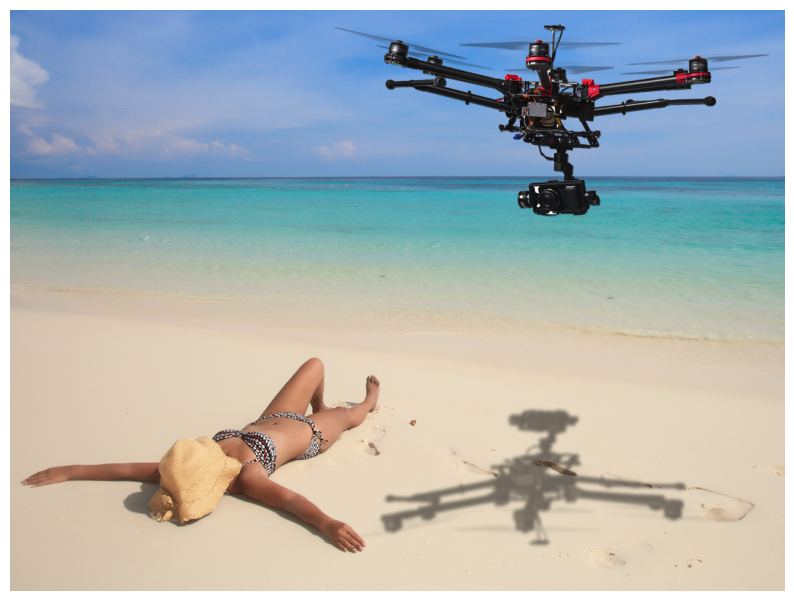

In [10]:
#@title Wybierz indeks przykladowego zdjecia drona ze zbioru treningowego:

idx = 755 #@param {type:'slider', min:0, max:919}
names_mapping = dict(enumerate(drone_fnames))
img_path = os.path.join(train_drone_dir, names_mapping[idx])

img = tf.keras.preprocessing.image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

(np.float64(-0.5), np.float64(999.5), np.float64(999.5), np.float64(-0.5))

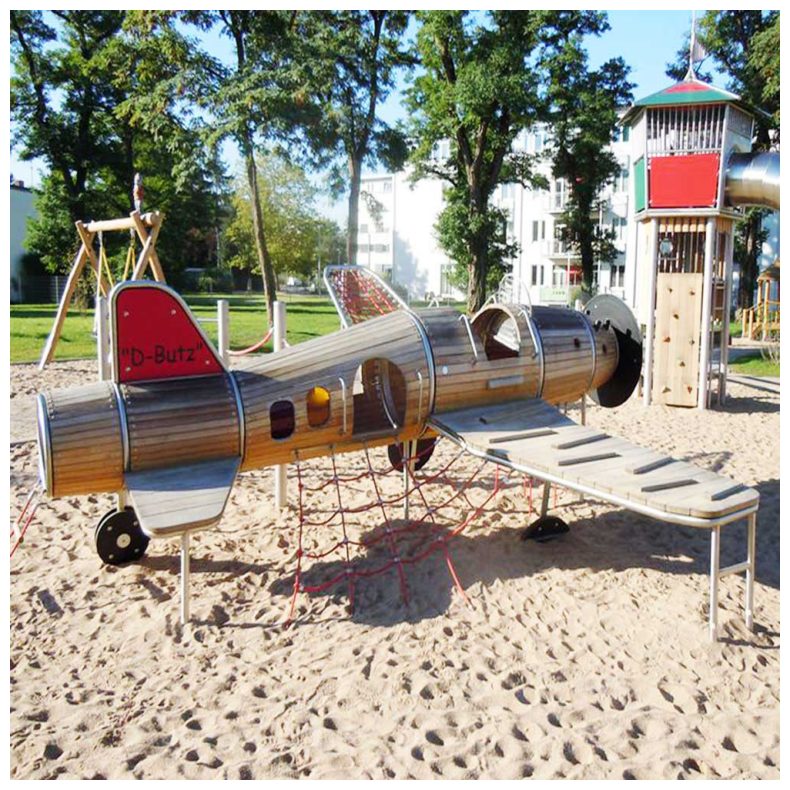

In [11]:
#@title Wybierz indeks przykladowego zdjecia samolotu pasazerskiego ze zbioru treningowego:

idx = 519 #@param {type:'slider', min:0, max:919}
names_mapping = dict(enumerate(passenger_fnames))
img_path = os.path.join(train_passenger_dir, names_mapping[idx])

img = tf.keras.preprocessing.image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

### <a name='a4'></a> Augmentcja danych

In [12]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=40,                # zakres kąta o który losowo zostanie wykonany obrót obrazów
    rescale=1./255.,
    width_shift_range=0.2,            # pionowe przekształcenia obrazu
    height_shift_range=0.2,           # poziome przekształcenia obrazu
    shear_range=0.2,                  # zares losowego przycianania obrazu
    zoom_range=0.2,                   # zakres losowego przybliżania obrazu
    horizontal_flip=True,             # losowe odbicie połowy obrazu w płaszczyźnie poziomej
    fill_mode='nearest'               # strategia wypełniania nowo utworzonych pikseli, któe mogą powstać w wyniku przekształceń
)

# przeskalowujemy wszystkie obrazy o współczynnik 1/255
valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)


train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                    target_size=(150, 150),
                                                    batch_size=32,
                                                    class_mode='binary')

valid_generator = valid_datagen.flow_from_directory(directory=valid_dir,
                                                    target_size=(150, 150),
                                                    batch_size=32,
                                                    class_mode='binary')

Found 1838 images belonging to 2 classes.
Found 524 images belonging to 2 classes.


In [13]:
def display_augmented_images(directory, idx):
  """
  Funkcja zwraca wykres przykladowych obrazow uzyskanych za pomoca techniki augmentacji danych.
  """
  fnames = [os.path.join(directory, fname) for fname in os.listdir(directory)]
  img_path = fnames[idx]
  img = tf.keras.preprocessing.image.load_img(img_path, target_size=(150, 150))

  x = tf.keras.preprocessing.image.img_to_array(img)
  x = x.reshape((1, ) + x.shape)

  i = 1
  plt.figure(figsize=(16, 8))
  for batch in train_datagen.flow(x, batch_size=1):
    plt.subplot(3, 4, i)
    plt.grid(False)
    imgplot = plt.imshow(tf.keras.preprocessing.image.array_to_img(batch[0]))
    i += 1
    if i % 13 == 0:
      break

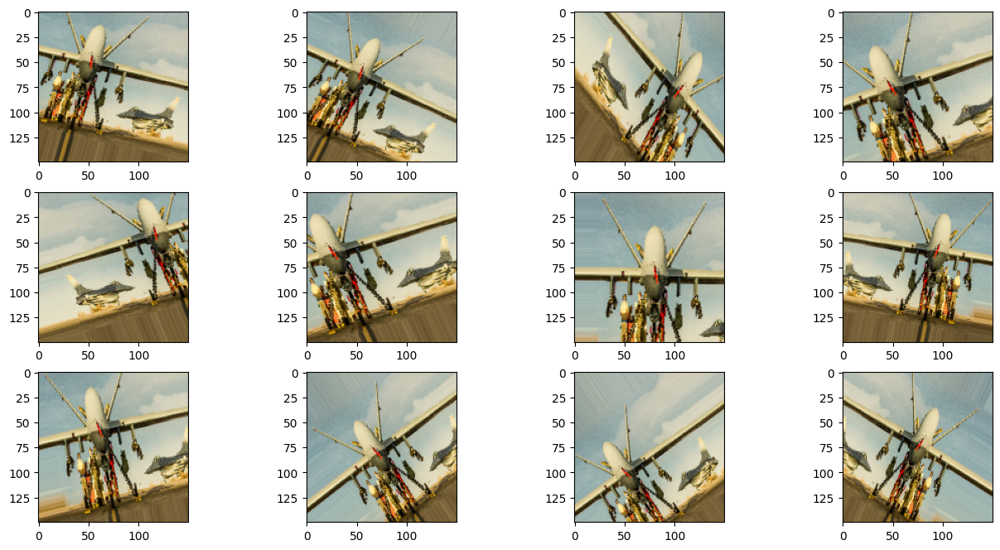

In [14]:
#@title Zbior treningowy drone:
idx = 555 #@param {type:'slider', min:0, max:919}
display_augmented_images(train_drone_dir, idx)

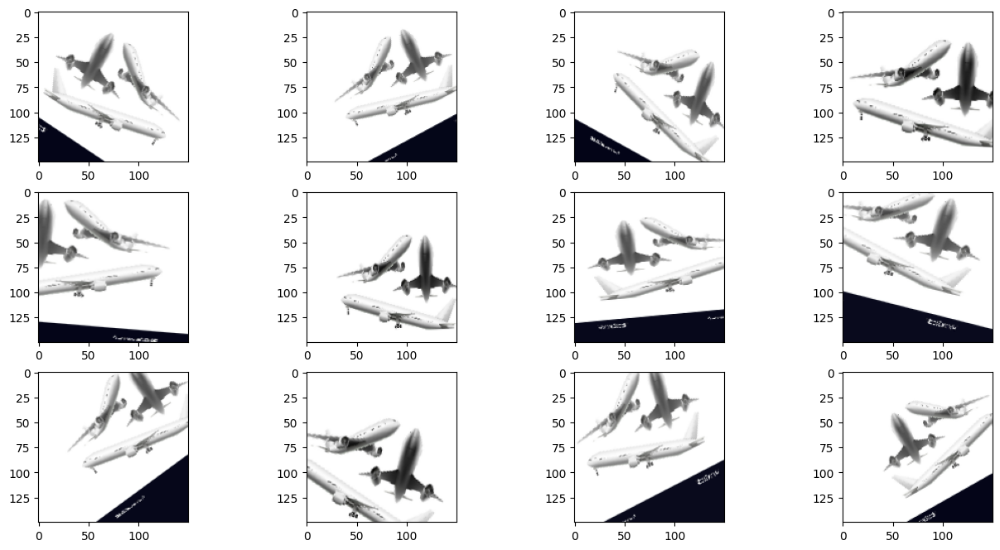

In [15]:
#@title Zbior treningowy passenger:
idx = 338 #@param {type:'slider', min:0, max:919}
display_augmented_images(train_passenger_dir, idx)

### <a name='a5'></a> Budowa modelu

In [16]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=1, activation='sigmoid')
])
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,453,121 (13.17 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [18]:
!rm -rf logs
!mkdir logs

from tensorflow.keras.callbacks import TensorBoard

tensorboard = TensorBoard(log_dir='logs')

In [19]:
batch_size = 32
steps_per_epoch = train_size // batch_size
validation_steps = valid_size // batch_size

history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=30,      #100
                    validation_data=valid_generator,
                    validation_steps=validation_steps,
                    callbacks=[tensorboard])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 23s 611ms/step - accuracy: 0.5251 - loss: 0.6954 - val_accuracy: 0.5547 - val_loss: 0.6908
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 18s 648ms/step - accuracy: 0.5148 - loss: 0.6939 - val_accuracy: 0.5195 - val_loss: 0.6976
Epoch 3/30
 1/28 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4375 - loss: 0.7204

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 167ms/step - accuracy: 0.4074 - loss: 0.7155 - val_accuracy: 0.4727 - val_loss: 0.6908
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 21s 747ms/step - accuracy: 0.5141 - loss: 0.6901 - val_accuracy: 0.5820 - val_loss: 0.6861
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 16s 592ms/step - accuracy: 0.5240 - loss: 0.6905 - val_accuracy: 0.4922 - val_loss: 0.6936
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - accuracy: 0.5312 - loss: 0.6802 - val_accuracy: 0.6094 - val_loss: 0.6765
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 20s 732ms/step - accuracy: 0.5490 - loss: 0.6889 - val_accuracy: 0.5703 - val_loss: 0.6810
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 21s 781ms/step - accuracy: 0.5551 - loss: 0.6808 - val_accuracy: 0.5664 - val_loss: 0.6700
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - accuracy: 0.5765 - loss: 0.6662 - val_accuracy: 0.4961 - val_loss: 0.6976
Epoch 10/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 53s 538ms/step - accuracy: 0.5452 - loss: 0.6838 - val_accuracy: 0.5000 -

In [20]:
%load_ext tensorboard

In [21]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [22]:
def plot_hist(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['accuracy'], name='accuracy', mode='markers+lines'))
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['val_accuracy'], name='val_accuracy', mode='markers+lines'))
    fig.update_layout(width=1000, height=500, title='Accuracy vs. Val Accuracy', xaxis_title='Epoki', yaxis_title='Accuracy', yaxis_type='log')
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['loss'], name='loss', mode='markers+lines'))
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['val_loss'], name='val_loss', mode='markers+lines'))
    fig.update_layout(width=1000, height=500, title='Loss vs. Val Loss', xaxis_title='Epoki', yaxis_title='Loss', yaxis_type='log')
    fig.show()

plot_hist(history)

### <a name='a6'></a> Transfer learning - model VGG16

In [67]:
conv_base = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [68]:
model = tf.keras.models.Sequential([
    conv_base,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.Dense(units=1, activation='sigmoid')
])
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 16,812,353 (64.13 MB)

 Non-trainable params: 0 (0.00 B)

In [69]:
print(f'Liczba warstw trenowanych przed zamrozeniem {len(model.trainable_weights)}')
conv_base.trainable = False
print(f'Liczba warstw trenowanych po zamrozeniu {len(model.trainable_weights)}')

Liczba warstw trenowanych przed zamrozeniem 30
Liczba warstw trenowanych po zamrozeniu 4


In [70]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [71]:
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=30,      #100
                    validation_data=valid_generator,
                    validation_steps=validation_steps,
                    callbacks=[tensorboard])

Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 20s 635ms/step - accuracy: 0.6016 - loss: 0.6908 - val_accuracy: 0.7617 - val_loss: 0.5261
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 612ms/step - accuracy: 0.7374 - loss: 0.5388 - val_accuracy: 0.7227 - val_loss: 0.5414
Epoch 3/30
 2/28 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - accuracy: 0.6172 - loss: 0.5694

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - accuracy: 0.6680 - loss: 0.5495 - val_accuracy: 0.7148 - val_loss: 0.5538
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 519ms/step - accuracy: 0.7511 - loss: 0.4899 - val_accuracy: 0.7383 - val_loss: 0.4809
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 20s 746ms/step - accuracy: 0.7370 - loss: 0.4914 - val_accuracy: 0.6875 - val_loss: 0.6210
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.5893 - loss: 0.6909 - val_accuracy: 0.7734 - val_loss: 0.4247
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 21s 739ms/step - accuracy: 0.7488 - loss: 0.5140 - val_accuracy: 0.7812 - val_loss: 0.4190
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 14s 523ms/step - accuracy: 0.7466 - loss: 0.4739 - val_accuracy: 0.7617 - val_loss: 0.4686
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 171ms/step - accuracy: 0.8114 - loss: 0.3557 - val_accuracy: 0.7656 - val_loss: 0.4849
Epoch 10/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 594ms/step - accuracy: 0.7986 - loss: 0.4273 - val_accuracy: 0.7461 -

In [72]:
import plotly.graph_objects as go
plot_hist(history)

### <a name='a7'></a> Transfer learning - model VGG16 - odmrożenie kilku ostatnich warstw

In [27]:
conv_base = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
conv_base.trainable = True

def print_layers(model):
  for layer in model.layers:
    print(f'layer_name: {layer.name:13} trainable: {layer.trainable}')

print_layers(conv_base)

layer_name: input_layer_3 trainable: True
layer_name: block1_conv1  trainable: True
layer_name: block1_conv2  trainable: True
layer_name: block1_pool   trainable: True
layer_name: block2_conv1  trainable: True
layer_name: block2_conv2  trainable: True
layer_name: block2_pool   trainable: True
layer_name: block3_conv1  trainable: True
layer_name: block3_conv2  trainable: True
layer_name: block3_conv3  trainable: True
layer_name: block3_pool   trainable: True
layer_name: block4_conv1  trainable: True
layer_name: block4_conv2  trainable: True
layer_name: block4_conv3  trainable: True
layer_name: block4_pool   trainable: True
layer_name: block5_conv1  trainable: True
layer_name: block5_conv2  trainable: True
layer_name: block5_conv3  trainable: True
layer_name: block5_pool   trainable: True


In [28]:
set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False

print_layers(conv_base)

layer_name: input_layer_3 trainable: False
layer_name: block1_conv1  trainable: False
layer_name: block1_conv2  trainable: False
layer_name: block1_pool   trainable: False
layer_name: block2_conv1  trainable: False
layer_name: block2_conv2  trainable: False
layer_name: block2_pool   trainable: False
layer_name: block3_conv1  trainable: False
layer_name: block3_conv2  trainable: False
layer_name: block3_conv3  trainable: False
layer_name: block3_pool   trainable: False
layer_name: block4_conv1  trainable: False
layer_name: block4_conv2  trainable: False
layer_name: block4_conv3  trainable: False
layer_name: block4_pool   trainable: False
layer_name: block5_conv1  trainable: True
layer_name: block5_conv2  trainable: True
layer_name: block5_conv3  trainable: True
layer_name: block5_pool   trainable: True


In [29]:
model = tf.keras.models.Sequential([
    conv_base,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.Dense(units=1, activation='sigmoid')
])

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-5),
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 9,177,089 (35.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [30]:
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=20,      #100
                    validation_data=valid_generator,
                    validation_steps=validation_steps,
                    callbacks=[tensorboard])

Epoch 1/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 26s 616ms/step - accuracy: 0.5974 - loss: 0.6563 - val_accuracy: 0.7109 - val_loss: 0.5783
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 19s 710ms/step - accuracy: 0.7471 - loss: 0.5494 - val_accuracy: 0.7656 - val_loss: 0.5025
Epoch 3/20
 2/28 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - accuracy: 0.7109 - loss: 0.5223

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - accuracy: 0.7037 - loss: 0.5346 - val_accuracy: 0.7617 - val_loss: 0.4905
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 581ms/step - accuracy: 0.7515 - loss: 0.5043 - val_accuracy: 0.8281 - val_loss: 0.4088
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 20s 729ms/step - accuracy: 0.7773 - loss: 0.4723 - val_accuracy: 0.8164 - val_loss: 0.3972
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - accuracy: 0.7165 - loss: 0.4844 - val_accuracy: 0.8008 - val_loss: 0.4679
Epoch 7/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 20s 729ms/step - accuracy: 0.7555 - loss: 0.4587 - val_accuracy: 0.7734 - val_loss: 0.4645
Epoch 8/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 21s 786ms/step - accuracy: 0.7592 - loss: 0.4832 - val_accuracy: 0.7891 - val_loss: 0.4123
Epoch 9/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - accuracy: 0.9074 - loss: 0.3337 - val_accuracy: 0.7734 - val_loss: 0.4720
Epoch 10/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 53s 611ms/step - accuracy: 0.8106 - loss: 0.4139 - val_accuracy: 0.8125 -

In [31]:
plot_hist(history)

### <a name='a8'></a> Ocena modelu na zbiorze testowym

In [32]:
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=1,
    class_mode='binary',
    shuffle=False
)

y_prob = model.predict(test_generator, test_generator.samples)
y_prob = y_prob.ravel()
y_prob

Found 262 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



262/262 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step


array([0.002345, 0.013655, 0.041414, 0.000355, 0.012143, 0.155887,
       0.001103, 0.005795, 0.005092, 0.150721, 0.352134, 0.02928 ,
       0.027113, 0.05524 , 0.011178, 0.003881, 0.030399, 0.592694,
       0.532629, 0.013532, 0.035759, 0.400449, 0.38465 , 0.557686,
       0.0008  , 0.007132, 0.002869, 0.002603, 0.01262 , 0.161521,
       0.000439, 0.028695, 0.076511, 0.004391, 0.005977, 0.259906,
       0.003829, 0.074577, 0.20757 , 0.52198 , 0.034473, 0.278587,
       0.986295, 0.03408 , 0.003252, 0.328538, 0.004531, 0.431   ,
       0.001085, 0.806846, 0.655727, 0.198774, 0.018866, 0.008308,
       0.381232, 0.120472, 0.304005, 0.12336 , 0.131667, 0.031426,
       0.093416, 0.014061, 0.133649, 0.135606, 0.068773, 0.043938,
       0.437174, 0.889105, 0.077922, 0.219696, 0.241162, 0.336421,
       0.43329 , 0.073601, 0.395668, 0.037213, 0.5013  , 0.050244,
       0.535273, 0.229615, 0.082559, 0.356206, 0.130554, 0.174438,
       0.260935, 0.084553, 0.096466, 0.754046, 0.075968, 0.057

In [33]:
predictions = pd.DataFrame({'y_prob': y_prob})
predictions['class'] = predictions['y_prob'].apply(lambda x: 1 if x > 0.5 else 0)
predictions

,y_prob,class
0,0.002345,0
1,0.013655,0
2,0.041414,0
3,0.000355,0
4,0.012143,0
...,...,...
257,0.900354,1
258,0.351591,0
259,0.206764,0
260,0.671126,1


In [34]:
y_true = test_generator.classes
y_true

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype=int32)

In [36]:
y_pred = predictions['class'].values
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1])

In [37]:
test_generator.class_indices

{'drone': 0, 'passenger': 1}

In [38]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[112,  19],
       [ 29, 102]])

In [39]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.85      0.82       131
           1       0.84      0.78      0.81       131

    accuracy                           0.82       262
   macro avg       0.82      0.82      0.82       262
weighted avg       0.82      0.82      0.82       262



### <a name='a9'></a> Wyświetlenie błędów predykcji

In [40]:
errors = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred}, index=test_generator.filenames)
errors

,y_true,y_pred
drone/00000012.jpg,0,0
drone/00000014.jpg,0,0
drone/00000044.jpg,0,0
drone/00000067.jpg,0,0
drone/00000081.jpg,0,0
...,...,...
passenger/00001430.jpg,1,1
passenger/00001438.jpg,1,0
passenger/00001445.jpg,1,0
passenger/00001487.jpg,1,1


In [42]:
errors['is_incorect'] = (errors['y_true'] != errors['y_pred']) * 1
errors

,y_true,y_pred,is_incorect
drone/00000012.jpg,0,0,0
drone/00000014.jpg,0,0,0
drone/00000044.jpg,0,0,0
drone/00000067.jpg,0,0,0
drone/00000081.jpg,0,0,0
...,...,...,...
passenger/00001430.jpg,1,1,0
passenger/00001438.jpg,1,0,1
passenger/00001445.jpg,1,0,1
passenger/00001487.jpg,1,1,0


In [43]:
errors[errors['is_incorect'] == 1].index

Index(['drone/00000258.jpg', 'drone/00000274.jpg', 'drone/00000345.jpg',
       'drone/00000561.jpg', 'drone/00000598.jpg', 'drone/00000656.jpg',
       'drone/00000660.jpg', 'drone/00000820.jpg', 'drone/00000890.jpg',
       'drone/00000910.jpg', 'drone/00001020.jpg', 'drone/00001136.jpg',
       'drone/00001211.jpg', 'drone/00001240.jpg', 'drone/00001248.png',
       'drone/00001253.jpg', 'drone/00001314.jpg', 'drone/00001348.jpg',
       'drone/00001377.jpg', 'passenger/00000161.jpg',
       'passenger/00000225.jpg', 'passenger/00000241.jpg',
       'passenger/00000247.jpg', 'passenger/00000273.jpg',
       'passenger/00000417.jpg', 'passenger/00000452.JPG',
       'passenger/00000459.jpg', 'passenger/00000556.jpg',
       'passenger/00000598.jpg', 'passenger/00000646.jpg',
       'passenger/00000683.jpg', 'passenger/00000692.jpg',
       'passenger/00000695.jpg', 'passenger/00000730.jpg',
       'passenger/00000760.jpg', 'passenger/00000780.jpg',
       'passenger/00000783.jpg', 'p

(np.float64(-0.5), np.float64(1271.5), np.float64(899.5), np.float64(-0.5))

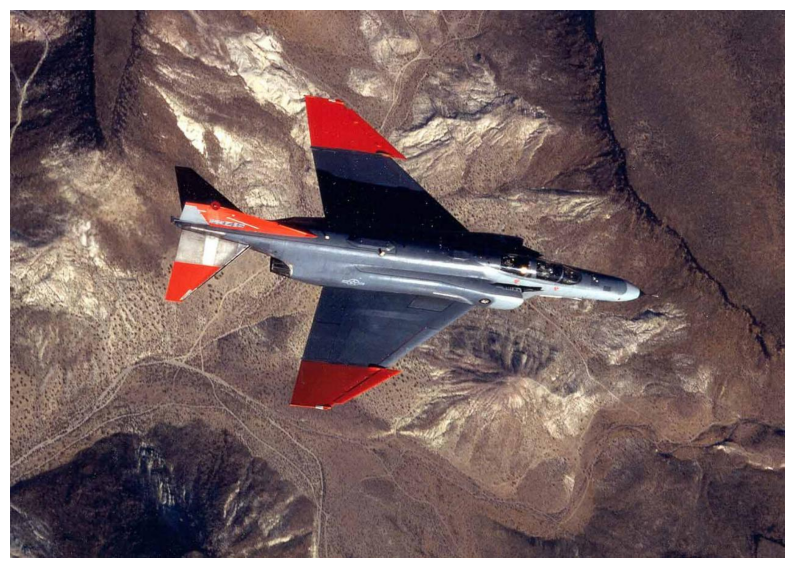

In [55]:
img_path = os.path.join(test_drone_dir, '00001240.jpg')

img = tf.keras.preprocessing.image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

In [56]:
errors[errors['is_incorect'] == 1].index

Index(['drone/00000258.jpg', 'drone/00000274.jpg', 'drone/00000345.jpg',
       'drone/00000561.jpg', 'drone/00000598.jpg', 'drone/00000656.jpg',
       'drone/00000660.jpg', 'drone/00000820.jpg', 'drone/00000890.jpg',
       'drone/00000910.jpg', 'drone/00001020.jpg', 'drone/00001136.jpg',
       'drone/00001211.jpg', 'drone/00001240.jpg', 'drone/00001248.png',
       'drone/00001253.jpg', 'drone/00001314.jpg', 'drone/00001348.jpg',
       'drone/00001377.jpg', 'passenger/00000161.jpg',
       'passenger/00000225.jpg', 'passenger/00000241.jpg',
       'passenger/00000247.jpg', 'passenger/00000273.jpg',
       'passenger/00000417.jpg', 'passenger/00000452.JPG',
       'passenger/00000459.jpg', 'passenger/00000556.jpg',
       'passenger/00000598.jpg', 'passenger/00000646.jpg',
       'passenger/00000683.jpg', 'passenger/00000692.jpg',
       'passenger/00000695.jpg', 'passenger/00000730.jpg',
       'passenger/00000760.jpg', 'passenger/00000780.jpg',
       'passenger/00000783.jpg', 'p

(np.float64(-0.5), np.float64(699.5), np.float64(699.5), np.float64(-0.5))

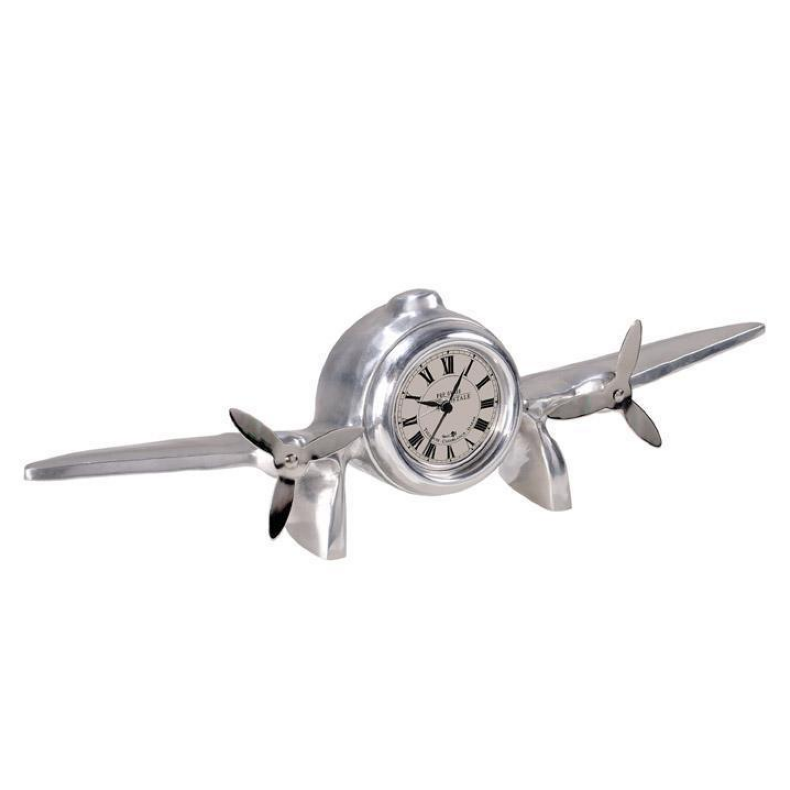

In [66]:
img_path = os.path.join(test_passenger_dir, '00000241.jpg')

img = tf.keras.preprocessing.image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)